In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Sample image display

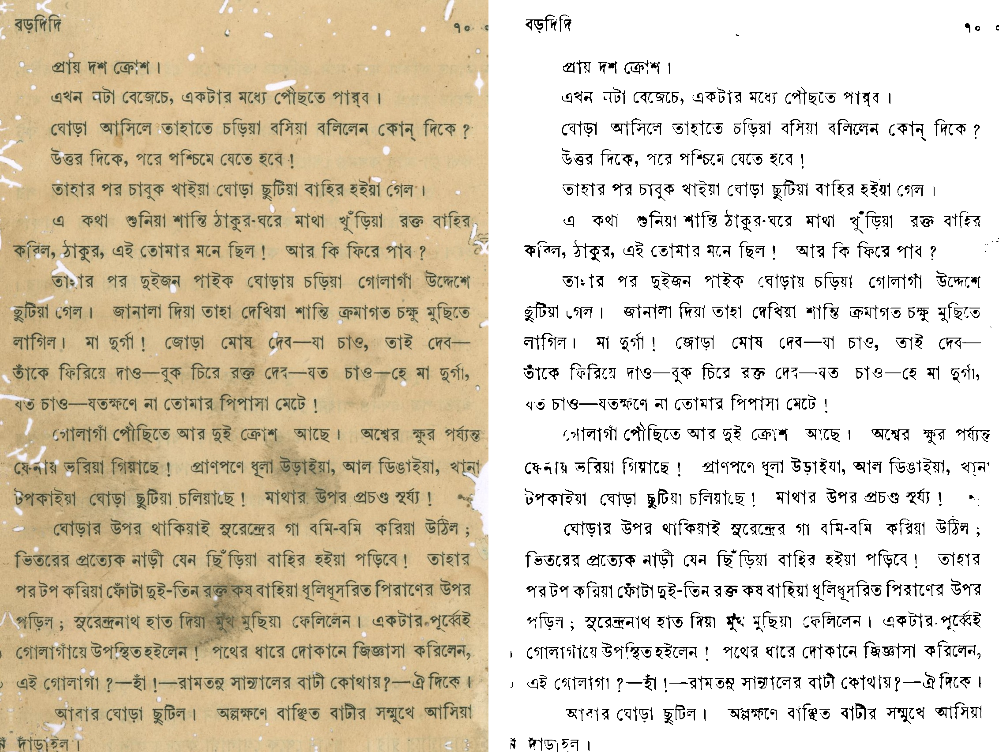

In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
from google.colab.patches import cv2_imshow

input_file = '/content/drive/MyDrive/final thesis folder which contains all information/after skew correction/Bardidi_pg070.jpeg'  
output_file = '/content/drive/MyDrive/sample for thesis/clear_image_9.jpg'  

img = cv2.imread(input_file)


if img is None:
    print(f"The image file {input_file} was not found. Please check the file path.")
else:
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    denoised_img = cv2.fastNlMeansDenoising(gray, h=16, templateWindowSize=7, searchWindowSize=28)
    
    alpha = 1
    beta = 0.9  
    adjusted_img = cv2.convertScaleAbs(denoised_img, alpha=alpha, beta=beta)
    kernel = np.ones((3, 3), np.uint8)
    morph_img = cv2.morphologyEx(adjusted_img, cv2.MORPH_OPEN, kernel)

    
    blurred = cv2.GaussianBlur(morph_img, (5, 5), 0)
    sharp_img = cv2.addWeighted(morph_img, 1.5, blurred, -0.5, 0)

    
    ret, thresh = cv2.threshold(sharp_img, 115, 255, cv2.THRESH_BINARY)

    
    cv2.imwrite(output_file, thresh)

    
    blank_space = np.ones((img.shape[0], 50, 3), dtype=np.uint8) * 255 

    
    thresh_bgr = cv2.cvtColor(thresh, cv2.COLOR_GRAY2BGR)

    
    combined_image = np.hstack((img, blank_space, thresh_bgr))

    cv2_imshow(combined_image)


Displaying each steps of preprocessing

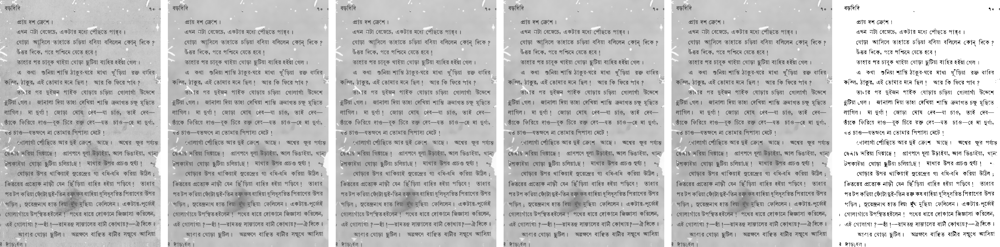

In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
from google.colab.patches import cv2_imshow

input_file = '/content/drive/MyDrive/final thesis folder which contains all information/after skew correction/Bardidi_pg070.jpeg' 
output_file = '/content/drive/MyDrive/sample for thesis/clear_image_9.jpg'  

img = cv2.imread(input_file)


if img is None:
    print(f"The image file {input_file} was not found. Please check the file path.")
else:
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    
    denoised_img = cv2.fastNlMeansDenoising(gray, h=16, templateWindowSize=7, searchWindowSize=28)

    
    alpha = 1
    beta = 0.9  
    adjusted_img = cv2.convertScaleAbs(denoised_img, alpha=alpha, beta=beta)

    
    kernel = np.ones((3, 3), np.uint8)
    morph_img = cv2.morphologyEx(adjusted_img, cv2.MORPH_OPEN, kernel)

    
    blurred = cv2.GaussianBlur(morph_img, (5, 5), 0)
    sharp_img = cv2.addWeighted(morph_img, 1.5, blurred, -0.5, 0)

    
    ret, thresh = cv2.threshold(sharp_img, 115, 255, cv2.THRESH_BINARY)
    cv2.imwrite(output_file, thresh)

    
    blank_space = np.ones((gray.shape[0], 50), dtype=np.uint8) * 255  

    combined_image = np.hstack((
        gray, blank_space,
        denoised_img, blank_space,
        adjusted_img, blank_space,
        morph_img, blank_space,
        sharp_img, blank_space,
        thresh
    ))

    cv2_imshow(combined_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


Sample image display

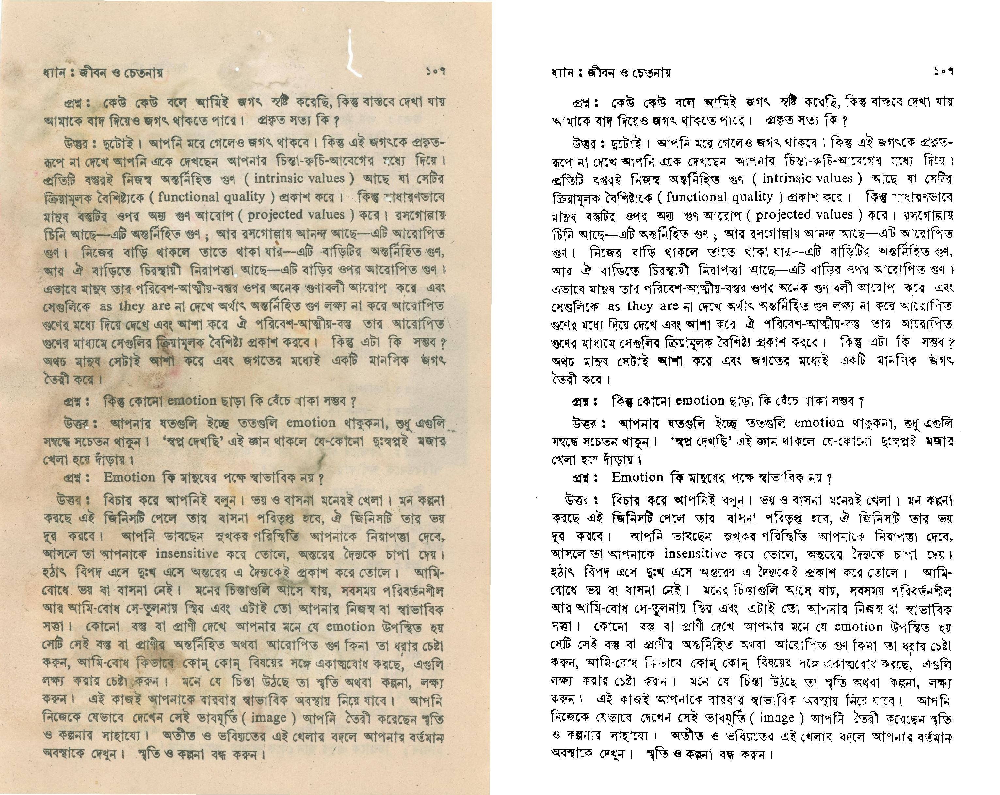

In [3]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

input_file = '/content/drive/MyDrive/final thesis folder which contains all information/after skew correction/DhyanOSakti_pg107.jpeg' 
output_file = '/content/drive/MyDrive/sample for thesis/clear_image_9.jpg' 


img = cv2.imread(input_file)


if img is None:
    print(f"The image file {input_file} was not found. Please check the file path.")
else:
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    denoised_img = cv2.fastNlMeansDenoising(gray, h=16, templateWindowSize=7, searchWindowSize=28)

    alpha = 1
    beta = 0.9  
    adjusted_img = cv2.convertScaleAbs(denoised_img, alpha=alpha, beta=beta)

    
    kernel = np.ones((3, 3), np.uint8)
    morph_img = cv2.morphologyEx(adjusted_img, cv2.MORPH_OPEN, kernel)

    
    blurred = cv2.GaussianBlur(morph_img, (5, 5), 0)
    sharp_img = cv2.addWeighted(morph_img, 1.5, blurred, -0.5, 0)

    
    ret, thresh = cv2.threshold(sharp_img, 115, 255, cv2.THRESH_BINARY)
    
    cv2.imwrite(output_file, thresh)

    thresh_bgr = cv2.cvtColor(thresh, cv2.COLOR_GRAY2BGR)

    blank_space = np.ones((img.shape[0], 50, 3), dtype=np.uint8) * 255  

    combined_image = np.hstack((img, blank_space, thresh_bgr))
    cv2_imshow(combined_image)


Preprocessing code for whole dataset


In [ ]:
####################################################### Main code for preprocessing################################################################3


import cv2
import numpy as np
from matplotlib import pyplot as plt
import pytesseract
import os


input_dir = '/content/drive/MyDrive/final thesis folder which contains all information/final dataset after skew'
output_dir = '/content/drive/MyDrive/final thesis folder which contains all information/ final dataset after preprocessing'


os.makedirs(output_dir, exist_ok=True)

image_files = os.listdir(input_dir)


for image_file in image_files:

    img = cv2.imread(os.path.join(input_dir, image_file))


    if img is None:
        print(f"The image file {image_file} was not found. Please check the file path.")
        continue


    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


    denoised_img = cv2.fastNlMeansDenoising(gray, h=16, templateWindowSize=7, searchWindowSize=28)
    alpha = 1
    beta = 0.9
    adjusted_img = cv2.convertScaleAbs(denoised_img, alpha=alpha, beta=beta)
    kernel = np.ones((3,3),np.uint8)
    morph_img = cv2.morphologyEx(adjusted_img, cv2.MORPH_OPEN, kernel)


    blurred = cv2.GaussianBlur(morph_img, (5, 5), 0)
    sharp_img = cv2.addWeighted(morph_img, 1.5, blurred, -0.5, 0)


    ret, thresh = cv2.threshold(sharp_img, 115, 255, cv2.THRESH_BINARY)


    cv2.imwrite(os.path.join(output_dir, f'result_{image_file}'), thresh)
